In [151]:
# imports
import os
import torch
import math
import scipy
import math
import re
import urllib
import random

from functools import partial
from typing import Any, Dict, Iterator, List, Tuple
from collections import Counter
from PIL import Image
from torch.utils.data import Subset


import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torch.nn as nn
import torch.utils.data as data
import torchvision.transforms as T

try:
    import pandas as pd
except ImportError:
    !pip install --upgrade pandas
    import pandas as pd

try:
    import seaborn as sns
except ImportError:
    !pip install --upgrade seaborn
    import seaborn as sns

%matplotlib inline

In [3]:
# type-setting
Array = np.ndarray
Tensor = torch.Tensor

### Utility functions

In [133]:
def entropy(p: Array) -> Array:
    return -(np.where(p > 0., p*np.log(p), 0)).sum()

def get_entropies(probas: Array) -> Array:
    return np.apply_along_axis(entropy, axis=1, arr=probas)

def jshannon(p: Array, q: Array) -> float:
    return scipy.spatial.distance.jensenshannon(p, q)

def load_vice_embedding(root: str) -> Array:
    return np.load(os.path.join(root, 'dimensions', 'vice_embedding.npy'))

### Data class

In [152]:
object_concepts_link = "https://raw.githubusercontent.com/ViCCo-Group/THINGSvision/master/thingsvision/data/things_concepts.tsv"

In [154]:
class THINGSTriplet(torch.utils.data.Dataset):

    def __init__(
        self,
        root,
        aligned: bool=True,
        transform=None,
        download=False):
        super(THINGSTriplet, self).__init__()
        self.root = root
        self.transform = transform
        self.download = download
    
        with open(os.path.join(self.root, 'triplets', 'correct_triplets.npy' if aligned else 'incorrect_triplets.npy'), 'rb') as f:
            self.triplets = np.load(f).astype(int)

        if download:
            f = urllib.request.urlopen(object_concepts_link)
        else:
            f = os.path.join(self.root, 'concepts', 'things_concepts.tsv')

        things_objects = pd.read_csv(f, sep='\t', encoding='utf-8')
        object_names = things_objects['uniqueID'].values

        self.names = list(map(lambda n: n + '.jpg', object_names))

    def __getitem__(self, index: int) -> Tuple[Tensor, Tensor, Tensor, int]:
        triplet = self.triplets[index]
        images = []
        for idx in triplet:
            img = os.path.join(self.root, 'images', self.names[idx])
            img = Image.open(img)
            if self.transform is not None:
                img = self.transform(img)
            images.append(img)
            
        return images[0], images[1], images[2]

    def __len__(self) -> int:
        return self.triplets.shape[0]

### Plotting functions

In [149]:
def plot_triangle():
    points = [(1, 4), (2, 1), (3, 4), (1, 4)]
    x, y = zip(*points)

    fig = plt.figure(figsize=(8, 4), dpi=80)
    ax = plt.subplot(111)

    #hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax.scatter(x, y, s=90)
    ax.plot(x, y, '--')
    
    ax.set_ylim([0, 5])
    ax.set_xlim([0, 5])
    ax.axis('off')
    plt.show()
    plt.close()

def plot_entropies(
    entropies_i: Array,
    entropies_j: Array,
    model_name: str
) -> None:
    
    fig = plt.figure(figsize=(10, 6), dpi=100)
    ax = plt.subplot(111)

    #hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    #only show ticks on the left (y-axis) and bottom (x-axis) spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    
    ax.scatter(x=entropies_i, y=entropies_j, alpha=.6)
    ax.set_xlabel(r'$H^{*}(\{i, j, k\})$', fontsize=18, labelpad=10)
    ax.set_ylabel(r'$\hat{H}(\{i, j, k\})$', fontsize=18, labelpad=10)
    
    ax.set_title(model_name, fontsize=20)
    plt.show()

def plot_triplet(
    img_triplet: tuple,
    aggregated_dimensions: List[Tuple[str, Array]],
    entropy: float,
) -> None:
    num_cols = len(img_triplet) + len(aggregated_dimensions)
    fig, axes = plt.subplots(1, num_cols, figsize=(20, 4), dpi=150)
    k = 0
    for i in range(num_cols):
        if i >= len(img_triplet):
            num_dims = aggregated_dimensions[k][1].shape[0]
            
            axes[i].spines['right'].set_visible(False)
            axes[i].spines['top'].set_visible(False)
            
            axes[i].yaxis.set_ticks_position('left')
            axes[i].xaxis.set_ticks_position('bottom')
            
            axes[i].bar(
                x=np.arange(1, num_dims+1),
                height=aggregated_dimensions[k][1],
                alpha=.5)
            
            axes[i].set_xticks(np.arange(1, num_dims+1, 4))
            axes[i].set_xlabel('Dimension', fontsize=15, labelpad=15)
            axes[i].set_title(aggregated_dimensions[k][0].capitalize() + ' ' + 'Aggregation', fontsize=14)
            k += 1
        else:
            axes[i].imshow(img_triplet[i])
            axes[i].set_xticks([])
            axes[i].set_yticks([])
            
            if i == 0:
                axes[i].set_ylabel(f'Entropy: {entropy:.3f}', fontsize=15, labelpad=15)

    plt.show()
    plt.close()
    
def aggregate_dimensions(embedding: Array, idx_triplet: Array, aggregation: str = 'pair'):
    triplet_embedding = embedding[idx_triplet]
    if aggregation == 'pair':
        aggregated_dimensions = triplet_embedding[:-1].mean(axis=0)
    elif aggregation == 'triplet':
        aggregated_dimensions = triplet_embedding.mean(axis=0)
    else:
        raise ValueError('\nAggregation only possible over a pair or triplet of objects\n')
    return aggregated_dimensions

def get_aggregated_dimensions(embedding: Array, idx_triplet: Array) -> List[Tuple[str, Array]]:
    aggregate = partial(aggregate_dimensions, embedding, idx_triplet)
    return [(aggregation, aggregate(aggregation)) for aggregation in ['pair', 'triplet']]
    

def show_triplets(dataset, num_samples: int, embedding: Array, entropies: Array) -> None:
    random_sample = torch.randperm(len(dataset))[:num_samples]
    img_subset = Subset(dataset, random_sample)
    idx_subset = dataset.triplets[random_sample]
    entropies_subset = entropies[random_sample]
    for img_triplet, idx_triplet, entropy in zip(img_subset, idx_subset, entropies_subset):
        aggregated_dimensions = get_aggregated_dimensions(embedding, idx_triplet)
        plot_triplet(img_triplet, aggregated_dimensions, entropy)

# Explore triplets

In [136]:
data_root = './things/'
vice_embedding = load_vice_embedding(data_root)

## *Aligned Triplets*
### Triplets for which VICE correctly predicted the odd-one-out choice

#### Entropy distribution

In [142]:
# load probabilities for correctly predicted triplets
probas_correct_triplets = np.load(os.path.join(data_root, 'probas', 'probabilities_correct_triplets.npy'))
entropies_correct_triplets = get_entropies(probas_correct_triplets)

print(f'\nAverage triplet entropy: {np.mean(entropies_correct_triplets)}')
print(f'Median triplet entropy: {np.median(entropies_correct_triplets)}\n')


Average triplet entropy: 0.7549219131469727
Median triplet entropy: 0.8372169733047485



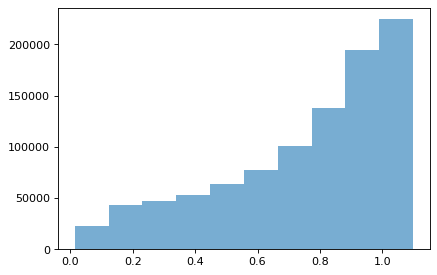

In [143]:
plt.figure(figsize=(6,4), dpi=80)
plt.hist(entropies_correct_triplets, alpha=0.6)
plt.show()

In [144]:
# things triplets for which VICE correctly predicted the odd-one-out choice
things_aligned = THINGSTriplet(
    root=data_root,
    aligned=True,
    transform=None,
    download=False
)

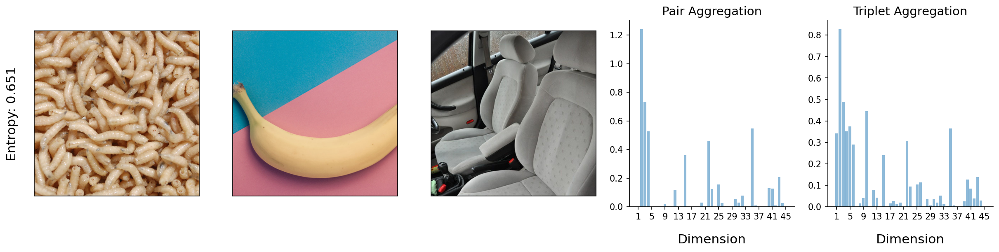

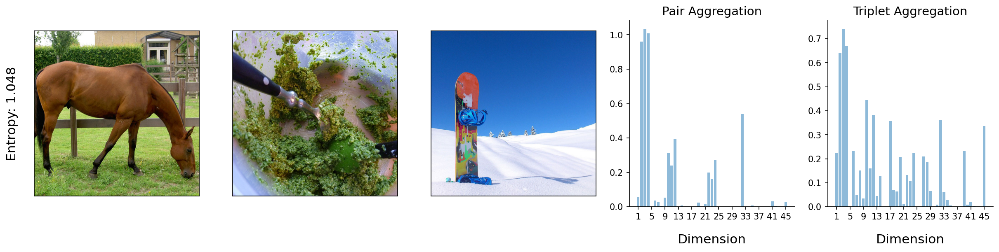

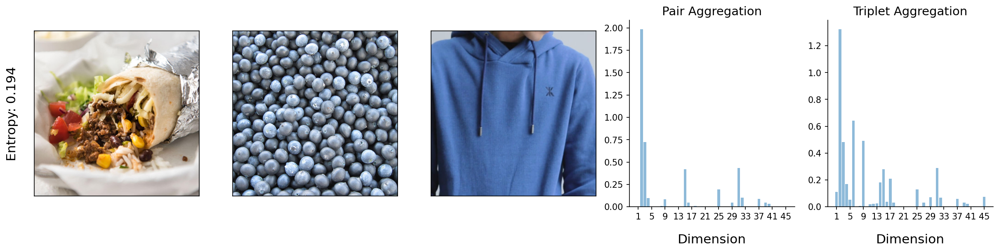

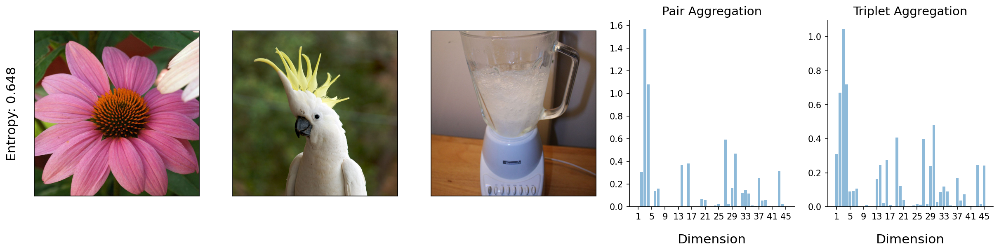

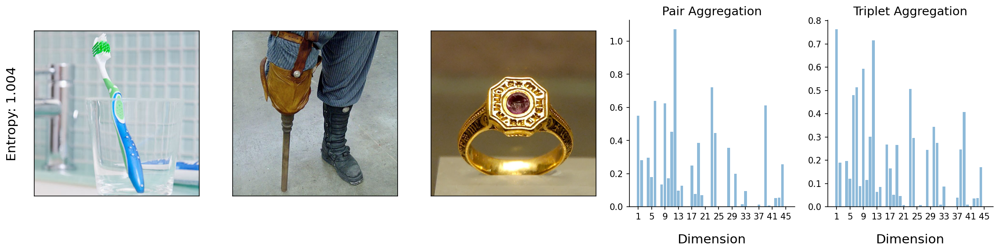

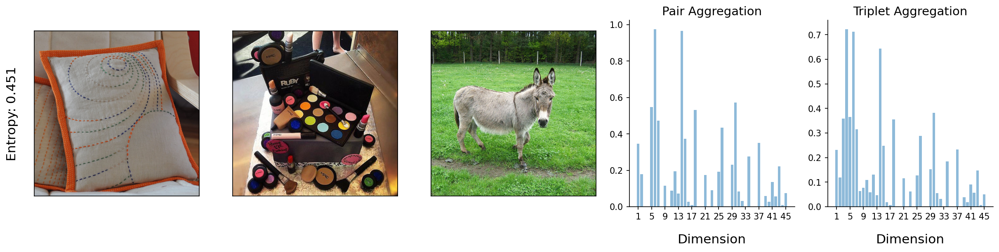

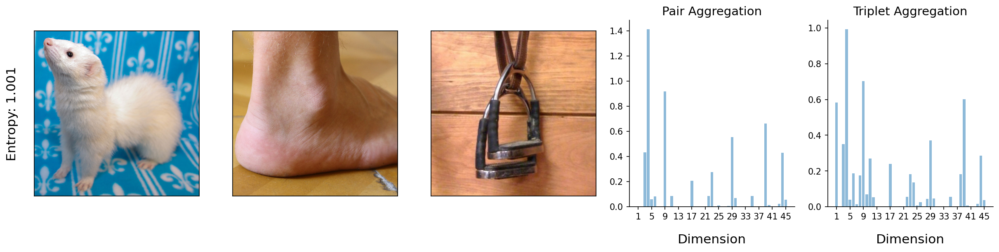

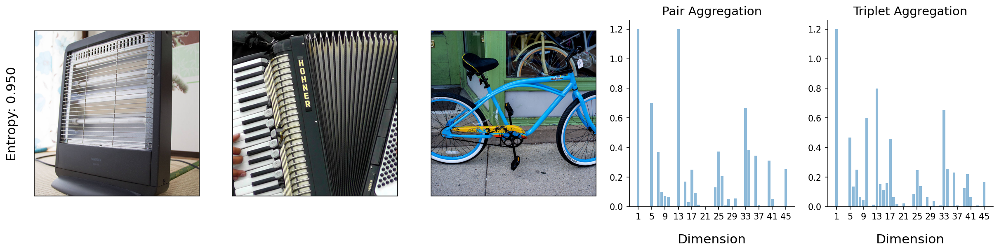

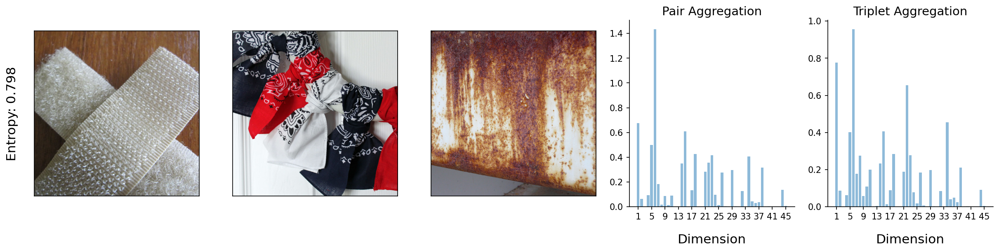

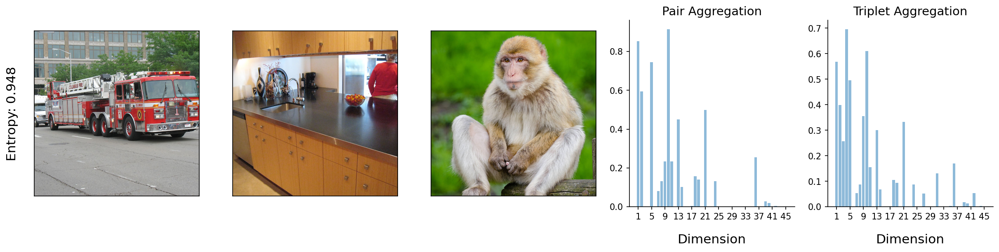

In [150]:
# show a subet of triplets
show_triplets(
    dataset=things_aligned, num_samples=10, embedding=vice_embedding, entropies=entropies_correct_triplets)

## *Unaligned Triplets*
### Triplets for which VICE did not correctly predicted the odd-one-out choice

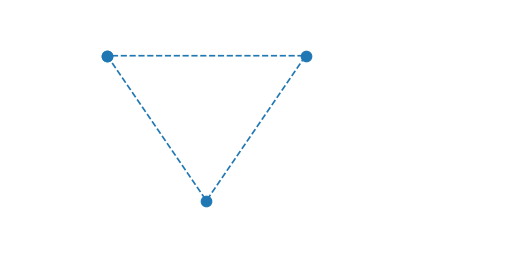

In [127]:
plot_triangle()

#### Triplet entropies

In [118]:
# load probabilities for incorrectly predicted triplets
probas_incorrect_triplets = np.load(os.path.join(data_root, 'probas', './probabilities_incorrect_triplets.npy'))
entropies_incorrect_triplets = get_entropies(probas_incorrect_triplets)
print(f'\nAverage triplet entropy: {np.mean(entropies_incorrect_triplets)}')
print(f'Median triplet entropy: {np.median(entropies_incorrect_triplets)}\n')


Average triplet entropy: 0.9341981410980225
Median triplet entropy: 0.9859526753425598



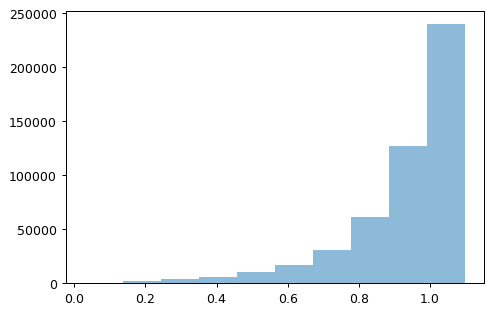

In [119]:
plt.figure(figsize=(6,4), dpi=90)
plt.hist(entropies_incorrect_triplets, alpha=.5)
plt.show()

In [122]:
things_unaligned = THINGSTriplet(
    root=data_root,
    aligned=False,
    transform=None,
    download=False
)

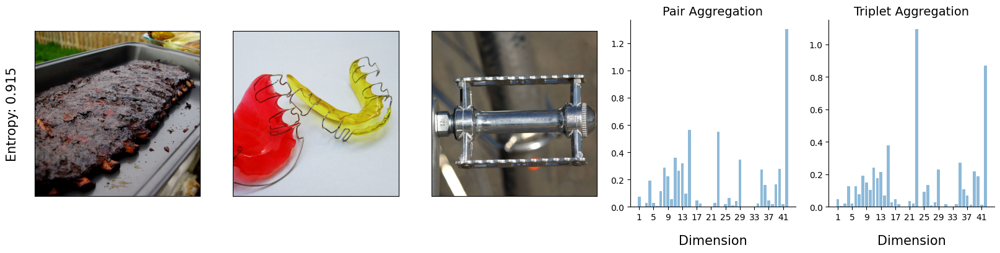

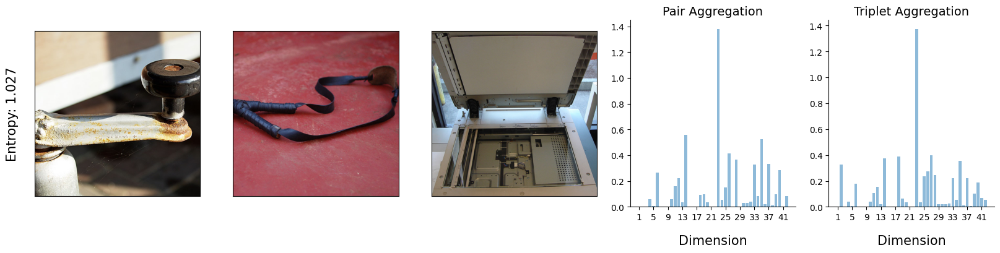

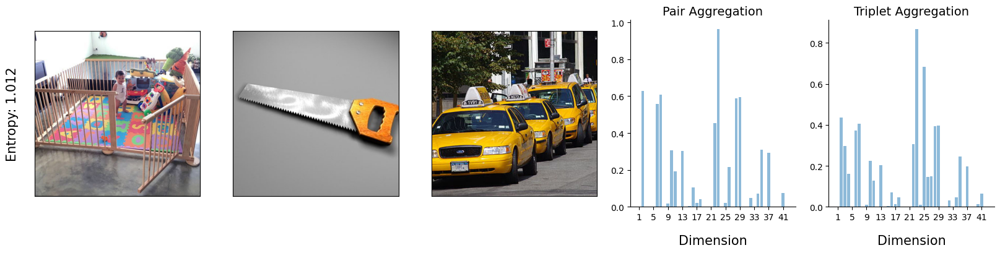

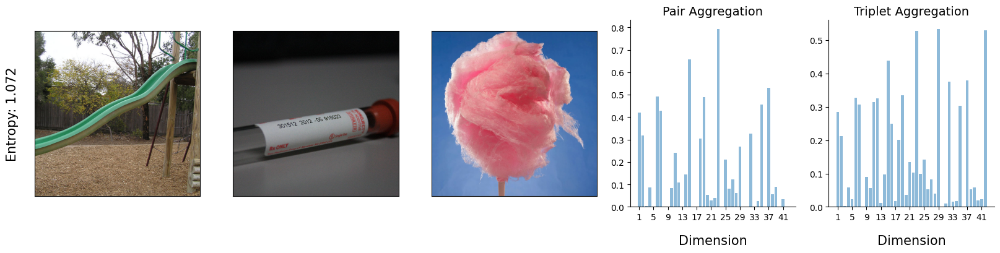

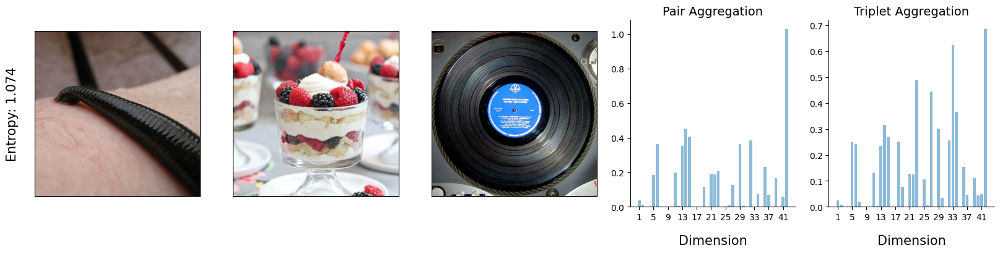

In [123]:
# show a subet of triplets for which VICE could not infer the "correct" odd-one-out choice
show_triplets(
    dataset=things_unaligned, num_samples=5, embedding=vice_embedding, entropies=entropies_incorrect_triplets)